In [1]:
import plotly
import numpy as np 
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt 
import os
import glob
#from sklearn.neighbors import NearestNeighbors

In [2]:
df=pd.read_pickle("reweighted.pkl")
df

,pdb,dcd,frame,rmsd,Q,embeddings,lof_score,sys_label,gpu_id,cluster_label,wall_clockt,cpt,outlier_MD_label,outlier_MD_frame,md_step,weight
0,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,0,3.838186,5.311395e-01,"[0.017263397574424744, 0.738886833190918, 0.30...",-1.000000,md_run_2_1709847450,2,36,1.709847e+09,NaN,NaN,NaN,0,1.000000e+00
1,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,1,3.894404,4.795416e-01,"[0.017263397574424744, 0.738886833190918, 0.30...",-1.000000,md_run_2_1709847450,2,36,1.709847e+09,NaN,NaN,NaN,1,1.000000e+00
2,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,2,3.947743,4.486119e-01,"[0.2485583871603012, 0.5979032516479492, 0.201...",-1.000000,md_run_2_1709847450,2,36,1.709847e+09,NaN,NaN,NaN,2,1.000000e+00
3,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,3,4.041379,4.824570e-01,"[-0.12910380959510803, 0.49059078097343445, 0....",-1.000000,md_run_2_1709847450,2,441,1.709847e+09,NaN,NaN,NaN,3,1.000000e+00
4,/project/zerze/ayushg/argonne/configs/multiICs...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,4,4.067689,4.975551e-01,"[0.2707480788230896, 0.4690714478492737, 0.528...",-1.000000,md_run_2_1709847450,2,487,1.709847e+09,NaN,NaN,NaN,4,1.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1028995,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,995,7.538620,1.175796e-20,"[-0.48277848958969116, 0.3115301728248596, 0.5...",-1.000000,md_run_7_1710304265,7,310,1.710304e+09,md_run_7_1710301593,NaN,NaN,171995,5.534173e-30
1028996,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,996,7.622481,7.734367e-21,"[-0.30358684062957764, 0.23337039351463318, 0....",-1.025333,md_run_7_1710304265,7,310,1.710304e+09,md_run_7_1710301593,NaN,NaN,171996,5.534173e-30
1028997,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,997,7.734472,1.222995e-20,"[-0.30083298683166504, 0.015502158552408218, 0...",-1.299760,md_run_7_1710304265,7,266,1.710304e+09,md_run_7_1710301593,NaN,NaN,171997,5.534173e-30
1028998,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,/project/zerze/ayushg/argonne/ddmd/rna13/test_...,998,7.671970,4.933934e-21,"[-0.047341570258140564, 0.10725318640470505, 0...",-1.369596,md_run_7_1710304265,7,136,1.710304e+09,md_run_7_1710301593,NaN,NaN,171998,5.534173e-30


In [ ]:
df.md_step.max()

In [3]:
embed=np.array(df['embeddings'].values.tolist())
RMSD= np.array(df['rmsd'].values.tolist())*0.1
LOF= np.array(df['lof_score'].values.tolist())

Q_df= np.array(df['Q'].values.tolist())    # all frames
weights= np.array(df['weight'].values.tolist())    # all frames
Q_df0= np.array(df['Q'][df.frame==0].values.tolist())   # only 1st frame of each dcd
LOF0= np.array(df['lof_score'][df.frame==0].values.tolist())   # only 1st frame of each dcd

In [ ]:
print(embed.shape[1]) # dimensionality of latent space
print(embed.shape)

In [ ]:
df10=df[::10]
df10

In [ ]:
embed10=np.array(df10['embeddings'].values.tolist())

from sklearn.manifold import TSNE
SEED = 42
np.random.seed(SEED)

tsne = TSNE(n_components=2, perplexity=50, random_state=SEED,n_iter=500)
tsne_result = tsne.fit_transform(embed10)
tsne_result.shape

In [4]:
import umap
#from umap import UMAP

embed10=np.array(df100['embeddings'].values.tolist())
umap_model = umap.UMAP(n_components=2,min_dist=0.0,n_neighbors=50,metric='euclidean',random_state=42)
umap_embeddings = umap_model.fit_transform(embed10)
umap_embeddings.shape

/home/agupta55/.local/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


(51450, 2)

In [ ]:
for i in range(tsne_result.shape[1]):
    df10[f'tsne{i+1}'] = [row[i] for row in tsne_result]
df10.to_pickle("tsne10.pkl")
df10

In [ ]:
df10=pd.read_pickle("tsne10.pkl")
df10

In [ ]:
df_rg10=pd.read_pickle("physical.pkl")
df_rg10=df_rg10[::10]
df_rg10

In [ ]:
df10['Rg']=df_rg10['Rg']
df10['E2E']=df_rg10['E2E']
df10

In [6]:
df10.to_pickle("tsne10_physical.pkl")

In [ ]:
df10=pd.read_pickle("tsne_physical.pkl")
df10

In [24]:
df10['rmsd']=df10['rmsd']*0.1

In [ ]:
fig = px.scatter(df10, 
                    x="tsne1", y="tsne2", 
                    color="rmsd",
                   size_max=2,width=550, height=420)
fig.update_layout(coloraxis_colorbar=dict(title=dict(text='RMSD (nm)', font=dict(size=24)),tickfont=dict(size=20)))
#fig.update_traces(marker=dict(size=10))
fig.update_layout(
    xaxis=dict(title=dict(text='tSNE 1', font=dict(size=24))),
    yaxis=dict(title=dict(text='tSNE 2', font=dict(size=24)))
)

fig.update_layout(
    xaxis=dict(tickfont=dict(size=22)),
    yaxis=dict(tickfont=dict(size=22))
)
fig.show()
fig.write_html("tsne_rmsd.html")

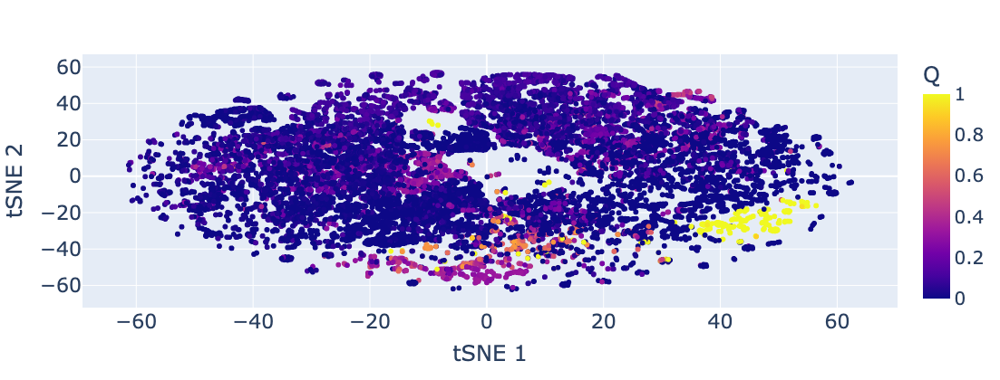

In [23]:
fig = px.scatter(df10, 
                    x="tsne1", y="tsne2", 
                    color="Q",
                   size_max=2,width=475, height=420)
fig.update_layout(coloraxis_colorbar=dict(title=dict(text='Q', font=dict(size=24)),tickfont=dict(size=20)))
#fig.update_traces(marker=dict(size=10))
fig.update_layout(
    xaxis=dict(title=dict(text='tSNE 1', font=dict(size=24))),
    yaxis=dict(title=dict(text='tSNE 2', font=dict(size=24)))
)

fig.update_layout(
    xaxis=dict(tickfont=dict(size=22)),
    yaxis=dict(tickfont=dict(size=22))
)
fig.show()
fig.write_html("tsne_Q.html")

In [ ]:
fig = px.scatter(df10, 
                    x="tsne1", y="tsne2", 
                    color="Rg",
                   size_max=2,width=515, height=420)
fig.update_layout(coloraxis_colorbar=dict(title=dict(text='Rg (nm)', font=dict(size=24)),tickfont=dict(size=20)))
#fig.update_traces(marker=dict(size=10))
fig.update_layout(
    xaxis=dict(title=dict(text='tSNE 1', font=dict(size=24))),
    yaxis=dict(title=dict(text='tSNE 2', font=dict(size=24)))
)

fig.update_layout(
    xaxis=dict(tickfont=dict(size=22)),
    yaxis=dict(tickfont=dict(size=22))
)
fig.show()
fig.write_html("tsne_Rg.html")

In [ ]:
fig = px.scatter(df10, 
                    x="tsne1", y="tsne2", 
                    color="E2E",
                   size_max=2,width=520, height=420)
fig.update_layout(coloraxis_colorbar=dict(title=dict(text='E2E (nm)', font=dict(size=24)),tickfont=dict(size=20)))
#fig.update_traces(marker=dict(size=10))
fig.update_layout(
    xaxis=dict(title=dict(text='tSNE 1', font=dict(size=24))),
    yaxis=dict(title=dict(text='tSNE 2', font=dict(size=24)))
)

fig.update_layout(
    xaxis=dict(tickfont=dict(size=22)),
    yaxis=dict(tickfont=dict(size=22))
)
fig.show()
fig.write_html("tsne_E2E.html")

##### Plot of outlier RMSDs i.e. RMSD of first frame of every trajectory

In [ ]:
sub_df = df[df.frame == 0]
RMSD_first_frame=np.array(sub_df['rmsd'].values.tolist())
y=range(1, len(RMSD)+1)

plt.title("0.5_f")
plt.xlabel("RMSD (A)")
plt.ylabel("MD Simulation no. i.e. progress of simulation in time")
plt.plot(RMSD, y)
plt.show()

fig, ax = plt.subplots(figsize =(10, 7))
ax.hist(RMSD_first_frame, bins = 100)
plt.title("Histogram")
plt.xlabel("RMSD of first frame (A)") 
# Show plot
plt.show()

In [4]:
from scipy import interpolate
from scipy.ndimage import gaussian_filter

In [5]:
kb=0.00831446 # kJ/mol/K
temperature=300 # K
beta=1./(kb*temperature)

### ESS for PTWTE-WTM at 300 K

/tmp/ipykernel_2501908/4288614951.py:18: RuntimeWarning: divide by zero encountered in log
  H2=-(1/beta)*np.log(gaussian_filter(H2, sigma=3))


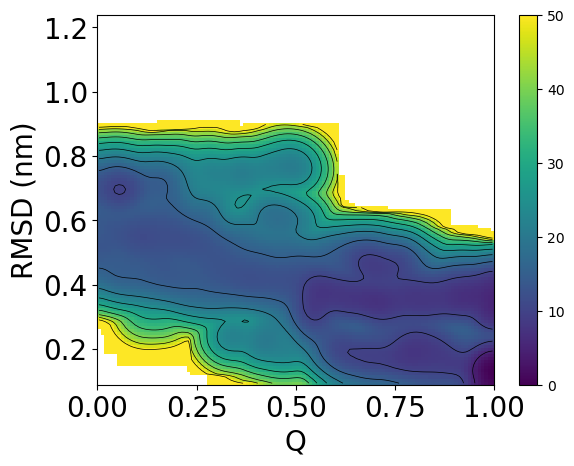

In [16]:
data=np.genfromtxt("/project/zerze/ayushg/argonne/ddmd/analysis/FED/colvar_PTWTE_WTM_Gul")
ignore=25000
time=np.copy(data[ignore:,16])
energy=np.copy(data[ignore:,1])
bias=np.copy(data[ignore:,3]+data[ignore:,9]+data[ignore:,12]+data[ignore:,14])
cmap=np.copy(data[ignore:,7])
rmsd=np.copy(data[ignore:,17])

logweights2 = beta*bias
logweights2 -= np.amax(logweights2)
weights2 = np.exp(logweights2)

rmsd_lim_min=min(min(rmsd),min(RMSD))
rmsd_lim_max=max(max(rmsd),max(RMSD))

H2, xedges1, yedges1 = np.histogram2d(cmap, rmsd, weights=weights2, bins=(120,120),range=[[Q_df.min(),Q_df.max()],[rmsd_lim_min,rmsd_lim_max]])
H2 = H2.T
H2=-(1/beta)*np.log(gaussian_filter(H2, sigma=3))
H2 -= np.amin(H2) 

X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.pcolormesh(X1, Y1, H2, vmin=0,vmax=50)
plt.colorbar()
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.

plt.contour(x,y, H2 ,np.arange(0,55,5),colors='black',linewidths=0.5)

plt.xlim([0,1])
plt.ylim([rmsd_lim_min,rmsd_lim_max])

plt.xlabel("Q", fontsize=20)
plt.ylabel("RMSD (nm)",fontsize=20)
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)

plt.show()

In [7]:
max(rmsd),max(RMSD), min(RMSD)

(0.7947481, 1.2384170826503675, 0.08818256141442549)

### DDMD FES

/tmp/ipykernel_2501908/2445388679.py:5: RuntimeWarning: divide by zero encountered in log
  H1=-(1/beta)*np.log(gaussian_filter(H1, sigma=3))


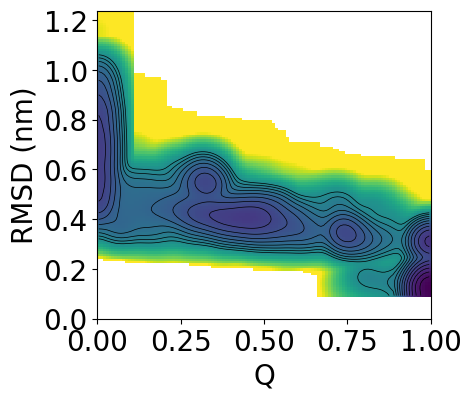

In [15]:
# Q and RMSD

H1, xedges1, yedges1 = np.histogram2d(Q_df, RMSD, weights=weights, bins=(120,120),range=[[Q_df.min(),Q_df.max()],[rmsd_lim_min,rmsd_lim_max]])
H1 = H1.T
H1=-(1/beta)*np.log(gaussian_filter(H1, sigma=3))
H1 -= np.amin(H1) 
X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.figure(figsize=(4.3, 4))  # Adjust the width and height as needed
plt.pcolormesh(X1, Y1, H1, vmin=0,vmax=50)
#plt.colorbar(label="kJ/mol")
#colorbar = plt.colorbar()
#colorbar.set_label(label='kJ/mol',size=18)
#colorbar.ax.tick_params(which='both', labelsize=17)
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.
#plt.contour(x,y, H1,20,vmin=0,vmax=20,colors='black',linewidths=0.5)
plt.contour(x,y, H1 ,np.arange(0,25,2),colors='black',linewidths=0.5)

plt.xlim([Q_df.min(),Q_df.max()])
plt.ylim([RMSD.min(),RMSD.max()])

plt.xlabel("Q", fontsize=20)
plt.ylabel("RMSD (nm)",fontsize=20)
#plt.title("No nudge,ld_6,32 kernels, C1 or C3, IC: Q=0.5, 8 A cut-off. 100000 mdsteps")
plt.tick_params(axis='x', labelsize=20)
plt.xticks(np.arange(0, 1.2,0.25))
plt.yticks(np.arange(0, 1.3,0.2))
plt.tick_params(axis='y', labelsize=20)
plt.show()

### Delta F; F(DDMD) -F (WTM)

/tmp/ipykernel_2501908/62964938.py:2: RuntimeWarning: invalid value encountered in subtract
  DH = np.sqrt((H1-H2)**2)


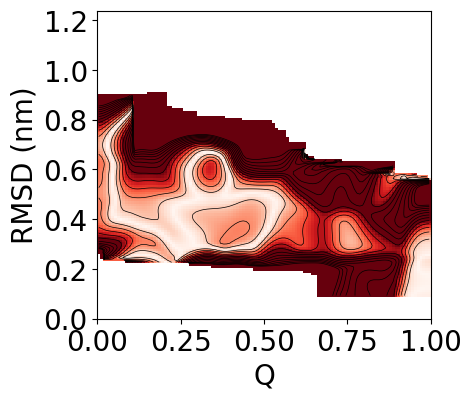

In [17]:
# Error
DH = np.sqrt((H1-H2)**2)

X1, Y1 = np.meshgrid(xedges1, yedges1)

plt.figure(figsize=(4.3, 4))  # Adjust the width and height as needed
plt.pcolormesh(X1, Y1, DH, vmin=0,vmax=10, cmap="Reds")

#plt.colorbar(label="kJ/mol")
#colorbar = plt.colorbar()
#colorbar.set_label(label='kJ/mol',size=18)
#colorbar.ax.tick_params(which='both', labelsize=17)
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.

plt.contour(x,y, DH ,np.arange(0,25,2),colors='black',linewidths=0.5)

plt.xlim([0,1])
plt.ylim([rmsd_lim_min,rmsd_lim_max])

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

#plt.title('DDMD')
plt.xlabel("Q",fontsize=20)
plt.ylabel("RMSD (nm)",fontsize=20)
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)
plt.xticks(np.arange(0, 1.2,0.25))
plt.yticks(np.arange(0, rmsd_lim_max,0.2))
plt.show()